In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from helpers import *

In [6]:
df_clasi = pd.read_csv('./Data/1.Clasificacion.csv')
df_clasi.head()

,Equipo,V,E,D,Goles a favor,Goles en contra,Puntos
0,FC Barcelona,28,4,6,70,20,88
1,Real Madrid,24,6,8,75,36,78
2,Atlético de Madrid,23,8,7,70,33,77
3,Real Sociedad,21,8,9,51,35,71
4,Villarreal CF,19,7,12,59,40,64


In [115]:
df_partidos = pd.read_csv('./Data/0.Partidos.csv')
df_partidos.head()

,Date,Time,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,12/08/2022,20:00,Osasuna,Sevilla FC,2,1,H,1,1,D,...,5,3,16,9,5,2,5,3,0,0
1,13/08/2022,16:00,Celta de Vigo,RCD Espanyol,2,2,D,1,0,H,...,3,2,17,15,3,3,5,2,0,0
2,13/08/2022,18:00,Real Valladolid,Villarreal CF,0,3,A,0,0,D,...,6,4,6,10,4,5,1,0,0,0
3,13/08/2022,20:00,FC Barcelona,Rayo Vallecano,0,0,D,0,0,D,...,6,2,16,14,8,0,3,6,1,0
4,14/08/2022,16:30,Cadiz CF,Real Sociedad,0,1,A,0,1,A,...,2,7,9,20,3,6,4,2,0,0


# RACHAS

C:\Users\aritz\AppData\Local\Temp\ipykernel_22944\3291570012.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_equipo['Resultado']=df_equipo.loc[:,'FTR']
C:\Users\aritz\AppData\Local\Temp\ipykernel_22944\3291570012.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_local['Resultado']=df_local.loc[:,'FTR']
C:\Users\aritz\AppData\Local\Temp\ipykernel_22944\3291570012.py:9: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavio

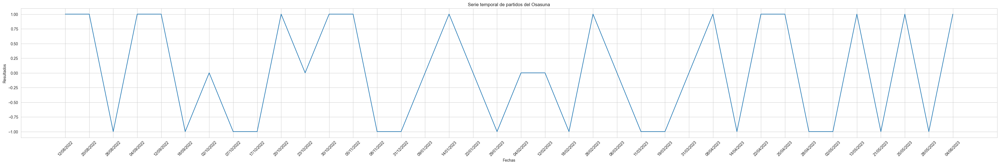

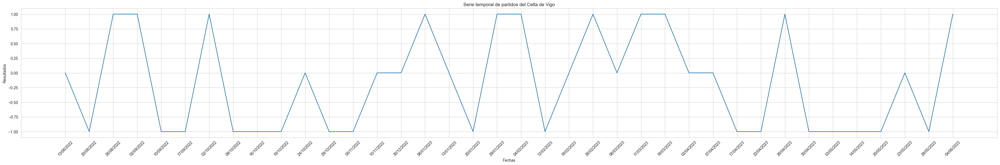

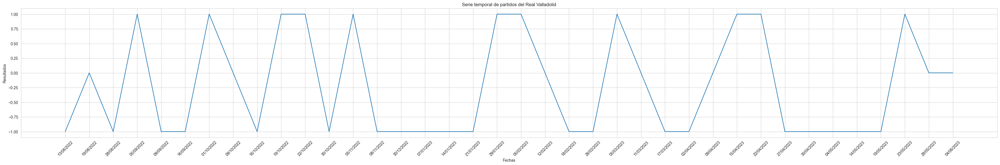

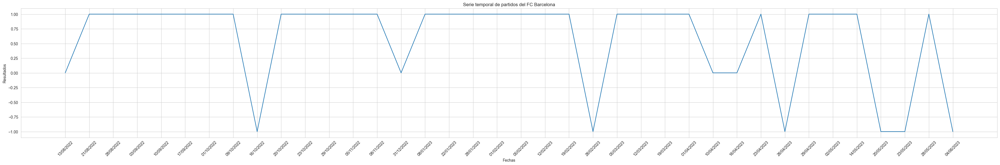

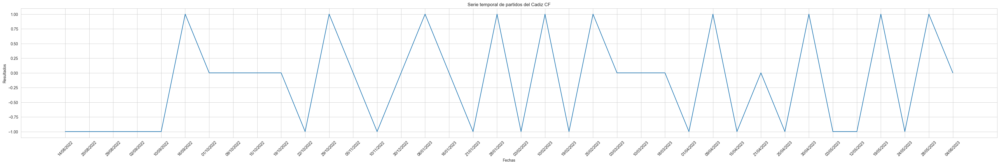

...

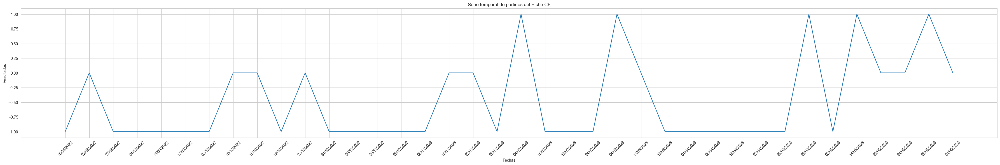

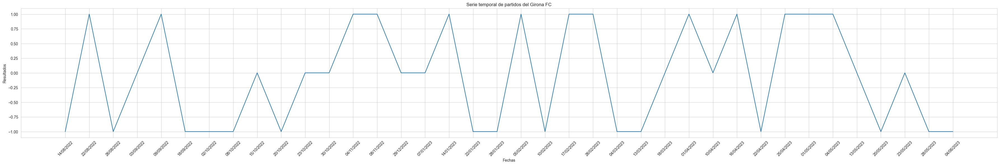

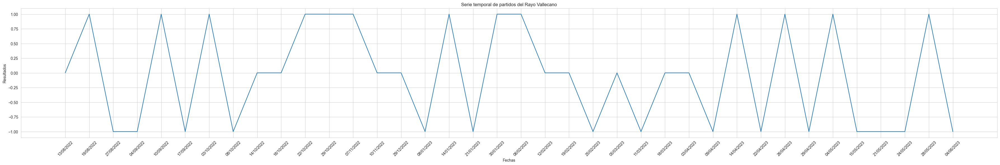

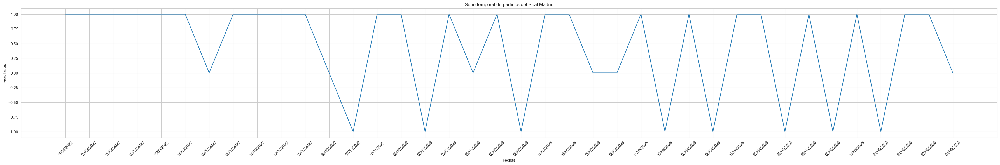

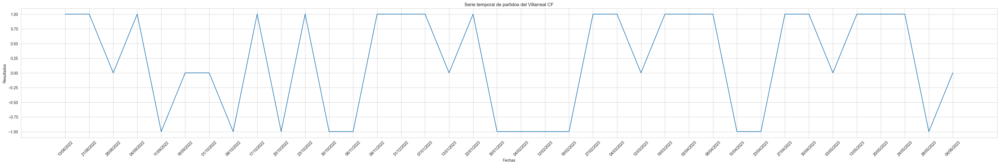

In [72]:
'''En esta parte del código se obtendrá para cada equipo de la liga una serie temporal con los resultados de los partidos
de forma que se pueda analizar si existe algun patro de rachas. Para ello, se han clasificado las victorias como un +1, los empates como +0 y las derrotas como -1
'''
for equipo in df_partidos['HomeTeam'].unique():
    df_equipo=data_equipo(df_partidos,equipo)
    df_local=data_local(df_equipo,equipo)
    df_visitante=data_visitante(df_equipo,equipo)
    df_equipo['Resultado']=df_equipo.loc[:,'FTR']
    mapeo_1 = {'H': 1, 'D': 0, 'A': -1}
    mapeo_2 = {'H': -1, 'D': 0, 'A': 1}
    df_local['Resultado']=df_local.loc[:,'FTR']
    df_local['Resultado']=df_local['Resultado'].replace(mapeo_1)
    df_visitante['Resultado']=df_visitante.loc[:,'FTR']
    df_visitante['Resultado']=df_visitante['Resultado'].replace(mapeo_2)
    df_equipo=df_equipo.reset_index()
    df_local=df_local.reset_index()
    df_visitante=df_visitante.reset_index()
    for i, date in enumerate(df_equipo['Date']):
        if date in df_local['Date'].values:
            k = np.where(df_local['Date'].values == date)[0][0]
            df_equipo.at[i, 'Resultado'] = df_local.at[k, 'Resultado']
        else:
            k = np.where(df_visitante['Date'].values == date)[0][0]
            df_equipo.at[i, 'Resultado'] = df_visitante.at[k, 'Resultado']

    plt.figure(figsize=(45, 6));
    sns.set_style("whitegrid");
    sns.lineplot(x='Date', y='Resultado', data=df_equipo);
    plt.xticks(rotation=45);
    plt.xlabel('Fechas');
    plt.ylabel('Resultados');
    plt.title('Serie temporal de partidos del ' + equipo);
    plt.savefig('./Serie Temporal/'+ equipo+'.png');
    

# Datos sobre tiros, tiros a puerta, goles, y ratios entre goles y tiros para cada equipo


HS: Home team shots.

AS: Away team shots.

HST: Home team shots on target.

AST: Away team shots on target.

In [3]:
df_partidos = pd.read_csv('./Data/0.Partidos.csv')

In [18]:
d_goles_tiros=dict() #diccionario que guardará como key los equipos y como value el numero de partidos en los que han metido un gol por cada 2 tiros a puerta
d_goles_tiros_total=dict() #diccionario que guardará como key los equipos y como value el numero de partidos en los que han metido un gol por cada 4 tiros
d_tiros=dict() #diccionario que guardará como key los equipos y como value el numero de tiros 
d_tiros_a_puerta=dict() #diccionario que guardará como key los equipos y como value el numero de tiros a puerta
d_goles=dict() #diccionario que guardará como key los equipos y como value el numero de goles 
for equipo in df_partidos['HomeTeam'].unique():
    df_equipo=data_equipo(df_partidos,equipo) #Creamos el dataframe del equipo
    df_local=data_local(df_equipo,equipo)           #Creamos el dataframe del equipo cuando juega de local
    df_visitante=data_visitante(df_equipo,equipo)   #Creamos el dataframe del equipo cuando juega de visitante
    df_equipo=df_equipo.reset_index()
    df_local=df_local.reset_index()
    df_visitante=df_visitante.reset_index()
    #creamos una nueva columna con los tiros a puerta, tiros totales del equipo en cada partido y goles que ha metido el equipo en cada partido.
    df_equipo['tiros_a_puerta_equipo']=np.array(range(len(df_equipo)))
    df_equipo['tiros_equipo']=np.array(range(len(df_equipo)))
    df_equipo['goles_equipo']=np.array(range(len(df_equipo)))
    for i, date in enumerate(df_equipo['Date']):
            if date in df_local['Date'].values:
                k = np.where(df_local['Date'].values == date)[0][0]
                df_equipo.at[i, 'tiros_a_puerta_equipo'] = df_local.at[k, 'HST']
                df_equipo.at[i, 'tiros_equipo'] = df_local.at[k, 'HS']
                df_equipo.at[i, 'goles_equipo'] = df_local.at[k, 'FTHG']
            else:
                k = np.where(df_visitante['Date'].values == date)[0][0]
                df_equipo.at[i, 'tiros_a_puerta_equipo'] = df_visitante.at[k, 'AST']
                df_equipo.at[i, 'tiros_equipo'] = df_visitante.at[k, 'AS']  
                df_equipo.at[i, 'goles_equipo'] = df_visitante.at[k, 'FTAG']
    d_goles[equipo]=sum(df_equipo['goles_equipo'])
    d_tiros[equipo]=sum(df_equipo['tiros_equipo'])
    d_tiros_a_puerta[equipo]=sum(df_equipo['tiros_a_puerta_equipo'])
    ratio_tiros=df_equipo['tiros_a_puerta_equipo']/df_equipo['tiros_equipo']
    df_equipo['ratio_tiros']=ratio_tiros
    goles_por_tiro=df_equipo['goles_equipo']/df_equipo['tiros_equipo']
    df_equipo['goles_por_tiro']=goles_por_tiro
    goles_por_tiro_a_puerta=df_equipo['goles_equipo']/df_equipo['tiros_a_puerta_equipo']
    df_equipo['goles_por_tiro_a_puerta']=goles_por_tiro_a_puerta
    d_goles_tiros[equipo]=len(df_equipo[df_equipo['goles_por_tiro_a_puerta']>=0.5])
    d_goles_tiros_total[equipo]=len(df_equipo[df_equipo['goles_por_tiro']>=0.25])

In [19]:
#Creamos unas lista de tuplas con los diccionarios obtenidos
l_goles_tiros=list(d_goles_tiros.items())
l_goles_tiros_total=list(d_goles_tiros_total.items())
l_tiros=list(d_tiros.items())
l_tiros_a_puerta=list(d_tiros_a_puerta.items())
l_goles=list(d_goles.items())
#Los ordenamos de forma que sigan el mismo orden que la clasificación de la liga
l_goles_tiros = sorted(l_goles_tiros, key=lambda x: list(df_clasi['Equipo']).index(x[0]))
l_goles_tiros_total = sorted(l_goles_tiros_total, key=lambda x: list(df_clasi['Equipo']).index(x[0]))
l_tiros = sorted(l_tiros, key=lambda x: list(df_clasi['Equipo']).index(x[0]))
l_tiros_a_puerta = sorted(l_tiros_a_puerta, key=lambda x: list(df_clasi['Equipo']).index(x[0]))
l_goles = sorted(l_goles, key=lambda x: list(df_clasi['Equipo']).index(x[0]))


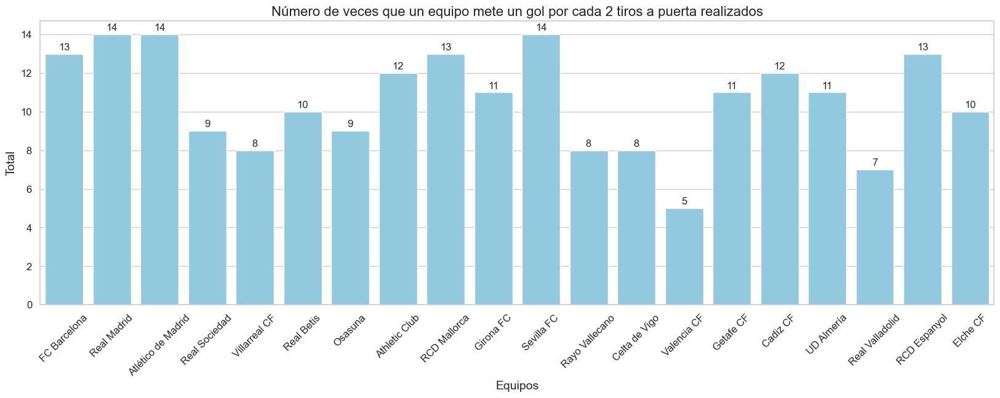

In [20]:
#Creamos un diagrama de barras con los datos obtenidos 
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=[tp[1] for tp in l_goles_tiros], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Número de veces que un equipo mete un gol por cada 2 tiros a puerta realizados', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in [tp[1] for tp in l_goles_tiros]:
    plt.text(ubicaciones[c], i + 0.1, str(i), ha='center', va='bottom')
    c+=1
plt.show()

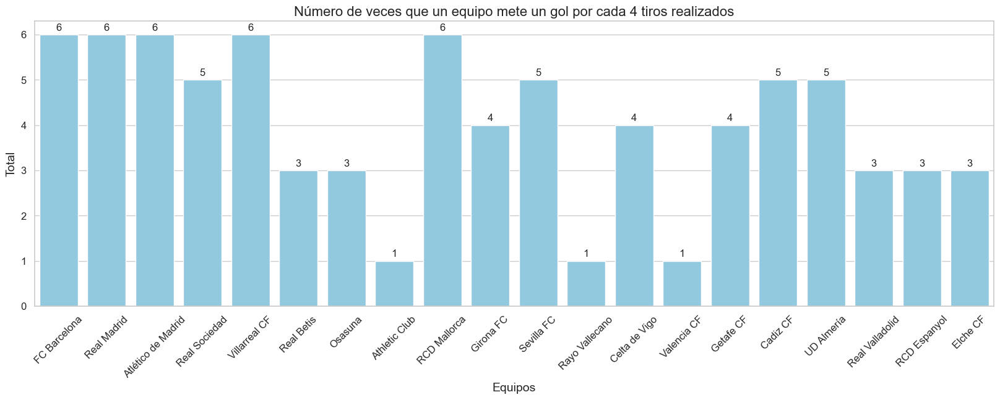

In [14]:
#Creamos un diagrama de barras con los datos obtenidos 
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=[tp[1] for tp in l_goles_tiros_total], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Número de veces que un equipo mete un gol por cada 4 tiros realizados', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in [tp[1] for tp in l_goles_tiros_total]:
    plt.text(ubicaciones[c], i + 0.05, str(i), ha='center', va='bottom')
    c+=1
plt.show()

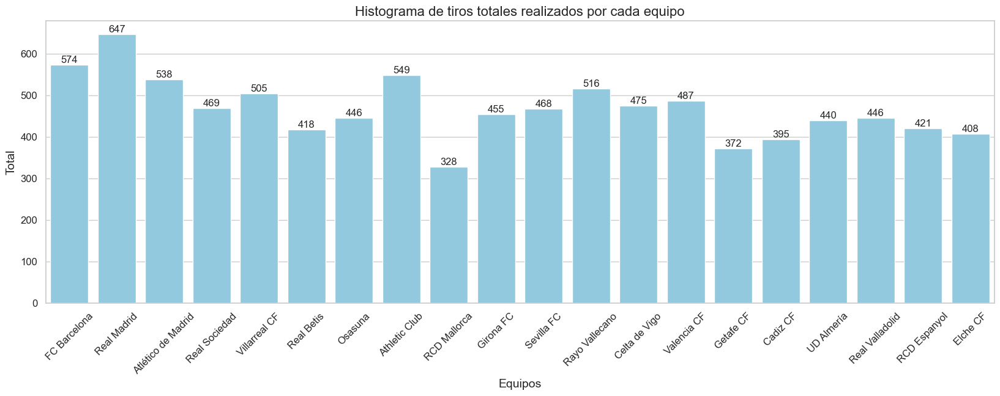

In [216]:
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=[tp[1] for tp in l_tiros], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Tiros totales realizados por cada equipo', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in [tp[1] for tp in l_tiros]:
    plt.text(ubicaciones[c], i + 0.2, str(i), ha='center', va='bottom')
    c+=1
plt.show()

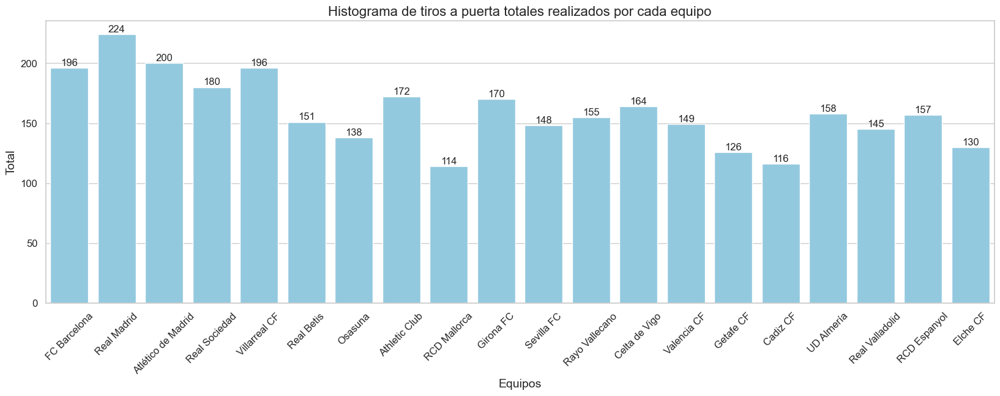

In [217]:
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=[tp[1] for tp in l_tiros_a_puerta], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Tiros a puerta totales realizados por cada equipo', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in [tp[1] for tp in l_tiros_a_puerta]:
    plt.text(ubicaciones[c], i + 0.2, str(i), ha='center', va='bottom')
    c+=1
plt.show()

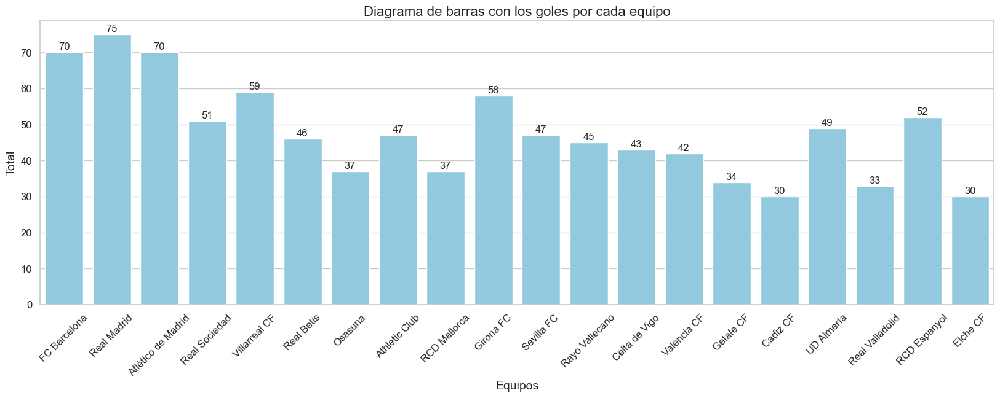

In [218]:
#Creamos un diagrama de barras con los datos obtenidos 
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=[tp[1] for tp in l_goles], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Goles por cada equipo', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in [tp[1] for tp in l_goles]:
    plt.text(ubicaciones[c], i + 0.2, str(i), ha='center', va='bottom')
    c+=1
plt.show()

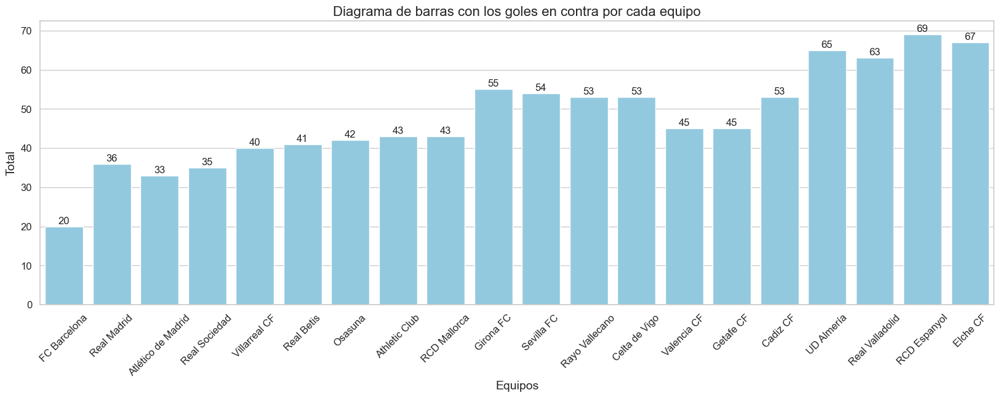

In [220]:
#Creamos un diagrama de barras con los datos obtenidos 
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=df_clasi['Goles en contra'], color='skyblue')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Goles en contra por cada equipo', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
ubicaciones, etiquetas = plt.xticks()
c=0
for i in df_clasi['Goles en contra']:
    plt.text(ubicaciones[c], i + 0.2, str(i), ha='center', va='bottom')
    c+=1
plt.show()

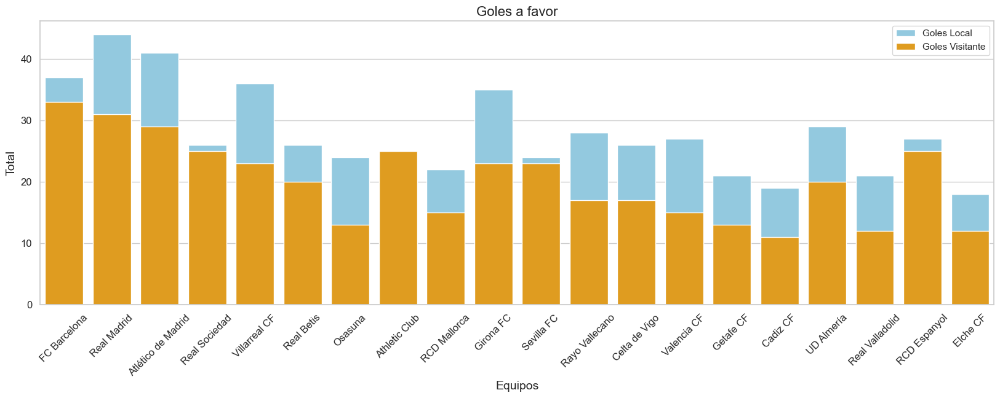

In [243]:
#Goles como equipo local y como visitante
goles_local=[]
goles_visitante=[]
for equipo in df_clasi['Equipo']:
    df_equipo=data_equipo(df_partidos,equipo)
    df_local=data_local(df_equipo,equipo)
    df_visitante=data_visitante(df_equipo,equipo)
    goles_local.append(sum(df_local['FTHG']))
    goles_visitante.append(sum(df_visitante['FTAG']))

sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=goles_local, color='skyblue',label='Goles Local')
sns.barplot(x=df_clasi['Equipo'], y=goles_visitante, color='orange',label='Goles Visitante')
plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Goles a favor', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend()
plt.show()

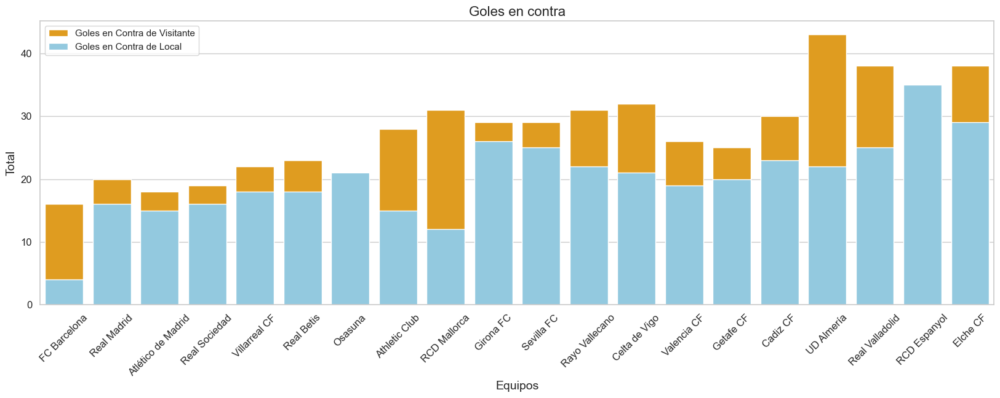

In [245]:
#Goles como equipo local y como visitante
goles_contra_local=[]
goles_contra_visitante=[]
for equipo in df_clasi['Equipo']:
    df_equipo=data_equipo(df_partidos,equipo)
    df_local=data_local(df_equipo,equipo)
    df_visitante=data_visitante(df_equipo,equipo)
    goles_contra_local.append(sum(df_local['FTAG']))
    goles_contra_visitante.append(sum(df_visitante['FTHG']))

sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))
sns.barplot(x=df_clasi['Equipo'], y=goles_contra_visitante, color='orange',label='Goles en Contra de Visitante')
sns.barplot(x=df_clasi['Equipo'], y=goles_contra_local, color='skyblue',label='Goles en Contra de Local')

plt.xlabel('Equipos', fontsize=14)
plt.ylabel('Total', fontsize=14)
plt.title('Goles en contra', fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend()
plt.show()

# Tendencias de Goles por equipo

In [ ]:
'''En esta parte voy a repetir codigo que he utilizado antes por el simple hecho de organizar mejor el notebook'''

In [3]:
df_partidos = pd.read_csv('./Data/0.Partidos.csv')
df_partidos.head()

,Date,Time,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTHG,HTAG,HTR,...,HST,AST,HF,AF,HC,AC,HY,AY,HR,AR
0,12/08/2022,20:00,Osasuna,Sevilla FC,2,1,H,1,1,D,...,5,3,16,9,5,2,5,3,0,0
1,13/08/2022,16:00,Celta de Vigo,RCD Espanyol,2,2,D,1,0,H,...,3,2,17,15,3,3,5,2,0,0
2,13/08/2022,18:00,Real Valladolid,Villarreal CF,0,3,A,0,0,D,...,6,4,6,10,4,5,1,0,0,0
3,13/08/2022,20:00,FC Barcelona,Rayo Vallecano,0,0,D,0,0,D,...,6,2,16,14,8,0,3,6,1,0
4,14/08/2022,16:30,Cadiz CF,Real Sociedad,0,1,A,0,1,A,...,2,7,9,20,3,6,4,2,0,0


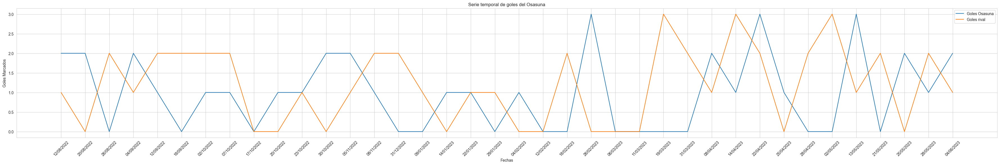

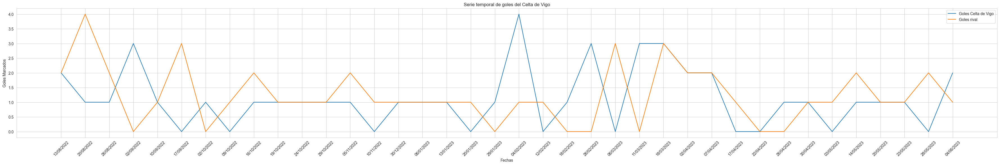

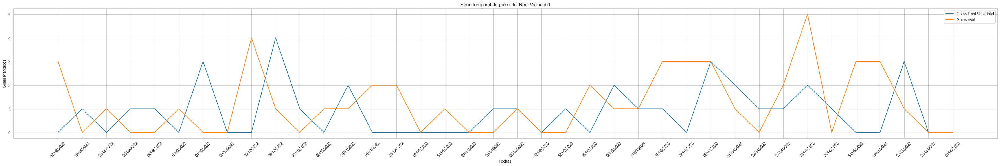

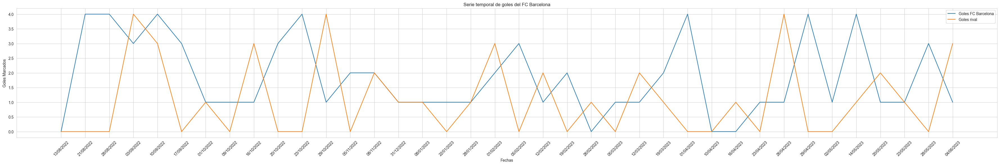

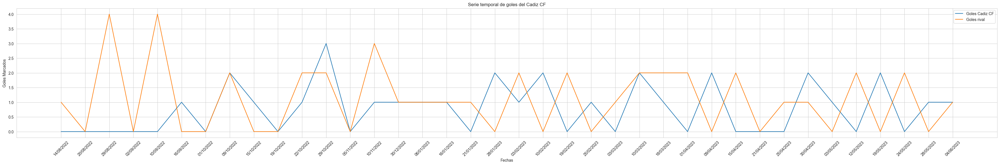

...

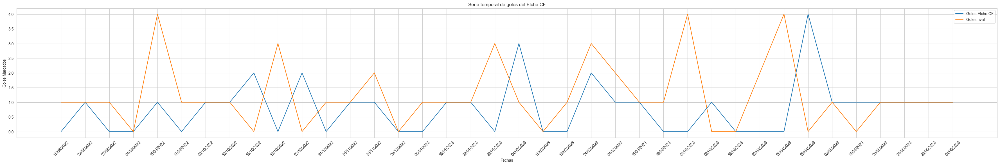

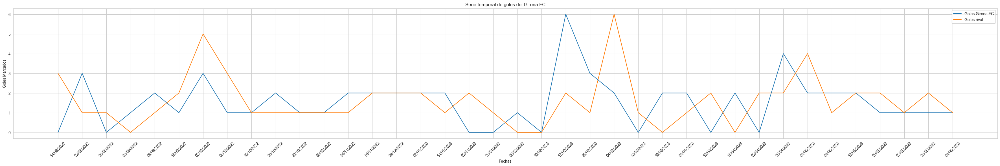

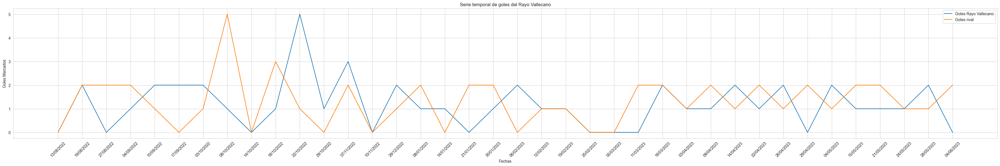

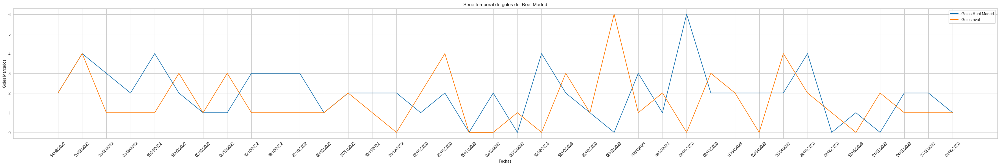

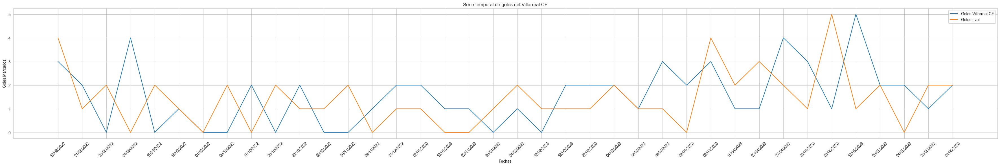

In [6]:
for equipo in df_partidos['HomeTeam'].unique():
    df_equipo=data_equipo(df_partidos,equipo)       #Creamos el dataframe del equipo
    df_local=data_local(df_equipo,equipo)           #Creamos el dataframe del equipo cuando juega de local
    df_visitante=data_visitante(df_equipo,equipo)   #Creamos el dataframe del equipo cuando juega de visitante
    df_equipo=df_equipo.reset_index()
    df_local=df_local.reset_index()
    df_visitante=df_visitante.reset_index()
    #creamos una nueva columna con los tiros a puerta, tiros totales del equipo en cada partido y goles que ha metido el equipo en cada partido.
    df_equipo['goles_equipo']=np.array(range(len(df_equipo)))
    df_equipo['goles_contra']=np.array(range(len(df_equipo)))
    for i, date in enumerate(df_equipo['Date']):
            if date in df_local['Date'].values:
                k = np.where(df_local['Date'].values == date)[0][0]
                df_equipo.at[i, 'goles_equipo'] = df_local.at[k, 'FTHG']
                df_equipo.at[i, 'goles_contra'] = df_local.at[k, 'FTAG']
            else:
                k = np.where(df_visitante['Date'].values == date)[0][0]
                df_equipo.at[i, 'goles_equipo'] = df_visitante.at[k, 'FTAG']
                df_equipo.at[i, 'goles_contra'] = df_local.at[k, 'FTHG']
    #mediana=np.median(df_equipo['goles_equipo'])  
    #media=np.mean(df_equipo['goles_equipo'])  
    plt.figure(figsize=(45, 6));
    sns.set_style("whitegrid");
    sns.lineplot(x='Date', y='goles_equipo', data=df_equipo, label='Goles ' + equipo);
    sns.lineplot(x='Date', y='goles_contra', data=df_equipo, label='Goles rival');
    #plt.axhline(y=media, color='r', linestyle='--', label='Media')
    #plt.axhline(y=mediana, color='g', linestyle='--', label='Mediana')
    plt.xticks(rotation=45);
    plt.xlabel('Fechas');
    plt.ylabel('Goles Marcados');
    plt.title('Serie temporal de goles del ' + equipo);
    plt.legend()
    plt.savefig('./Racha goles/'+ equipo+'.png');